# Проектная работа
Рынок заведений общественного питания Москвы

Необходимо подготовить исследование рынка общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года

## Загружаем данные и изучаем общую информацию

In [1]:
# импорт библиотек
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import folium
from folium.plugins import MarkerCluster
import json
from IPython.core.display import display, HTML

In [2]:
pd.set_option('display.max_rows', 500)  # Установите максимальное количество отображаемых строк
pd.set_option('display.max_columns', 10)

In [3]:
# устанавливаем стиль графиков
sns.set_style('whitegrid')
sns.set_context('notebook')  
sns.set_style("ticks")

In [4]:
# чтение файла с данными и сохранение в переменные
df = pd.read_csv('/datasets/moscow_places.csv')

In [5]:
# Подсчитываем количество уникальных заведений
unique_places_count = df['name'].nunique()
print("Количество уникальных заведений:", unique_places_count)

# Получаем информацию по типам данных каждого столбца
column_types = df.dtypes
print("\nТипы данных по столбцам:\n", column_types)

# Подсчитываем количество уникальных значений по каждому столбцу
column_uniques = df.nunique()
print("\nКоличество уникальных значений в каждом столбце:\n", column_uniques)

# Получаем статистическое описание данных
column_descriptions = df.describe(include='all')
display("Статистическое описание данных:", column_descriptions)

Количество уникальных заведений: 5614

Типы данных по столбцам:
 name                  object
category              object
address               object
district              object
hours                 object
lat                  float64
lng                  float64
rating               float64
price                 object
avg_bill              object
middle_avg_bill      float64
middle_coffee_cup    float64
chain                  int64
seats                float64
dtype: object

Количество уникальных значений в каждом столбце:
 name                 5614
category                8
address              5753
district                9
hours                1307
lat                  8209
lng                  8258
rating                 41
price                   4
avg_bill              897
middle_avg_bill       230
middle_coffee_cup      96
chain                   2
seats                 229
dtype: int64


'Статистическое описание данных:'

,name,category,address,district,hours,...,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406,8406,8406,8406,7870,...,3816,3149.000000,535.000000,8406.000000,4795.000000
unique,5614,8,5753,9,1307,...,897,NaN,NaN,NaN,NaN
top,Кафе,кафе,"Москва, проспект Вернадского, 86В",Центральный административный округ,"ежедневно, 10:00–22:00",...,Средний счёт:1000–1500 ₽,NaN,NaN,NaN,NaN
freq,189,2378,28,2242,759,...,241,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,...,NaN,958.053668,174.721495,0.381275,108.421689
std,NaN,NaN,NaN,NaN,NaN,...,NaN,1009.732845,88.951103,0.485729,122.833396
min,NaN,NaN,NaN,NaN,NaN,...,NaN,0.000000,60.000000,0.000000,0.000000
25%,NaN,NaN,NaN,NaN,NaN,...,NaN,375.000000,124.500000,0.000000,40.000000
50%,NaN,NaN,NaN,NaN,NaN,...,NaN,750.000000,169.000000,0.000000,75.000000
75%,NaN,NaN,NaN,NaN,NaN,...,NaN,1250.000000,225.000000,1.000000,140.000000


In [6]:
display(df.head(10))

,name,category,address,district,hours,...,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",...,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",...,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",...,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",...,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",...,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",...,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,...,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",...,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",...,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",...,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


Нам данны следующие данные:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
«Средний счёт: 1000–1500 ₽»;\
«Цена чашки капучино: 130–220 ₽»;\\
«Цена бокала пива: 400–600 ₽».\
и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.\
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.\
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:\
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.\
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.\
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):\
0 — заведение не является сетевым\
1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

На данный момент, мы видим что информация о 5614 заведениях, 8 категорий.Так же есть категории стоимости

## Выполним предобработку данных

In [7]:
# 1. Проверка и удаление дубликатов
duplicate_count = df.duplicated().sum()
print("Количество дубликатов до удаления:", duplicate_count)

Количество дубликатов до удаления: 0


In [8]:
# Проверим неявные дубликаты
df['name'] = df['name'].str.upper()
df['name'] = df['name'].str.strip()

In [9]:
df['address'] = df['address'].str.upper().str.strip()

In [10]:
duplicate_mask = df.duplicated(subset=['name', 'address'])
duplicate_count = duplicate_mask.sum()
duplicate_count

4

In [11]:
df = df[~duplicate_mask]

In [12]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [13]:
# Группируем и считаем количество записей для каждого уникального name
result = df.groupby('name').size().reset_index(name='count')

# Сортируем по количеству записей в порядке
result = result.sort_values(by=['count'], ascending=False).head(150)

# Вывод результата
print(result.sort_values(by=['name']).head(10))

                    name  count
48          9 BAR COFFEE      7
51   ABC COFFEE ROASTERS      5
209     BRASSERIE LAMBIC     13
246          BURGER CLUB      6
251                   BỔ      9
315               CHICKO      5
328             CINNABON     20
344             COFEFEST     32
348  COFFEE AND THE CITY      4
395        COFFEEKALDI'S      8


Проверить все наименования нет возможности, так же не понятно что за заведения входят в кафе, чайхона,  шаурма и так далее

In [14]:
# 2. Поиск и анализ пропусков в данных
missing_values = df.isnull().sum()
print("\nПропуски в данных:\n", missing_values)


Пропуски в данных:
 name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64


В данных много пропусков, дополнить данные нет возможности

In [15]:
# Создаем столбец'street' с названиями улиц, извлеченными из столбца 'address'
df['street'] = df['address'].apply(lambda x:x.split(",")[1].strip())
df['street'].head(10)

0              УЛИЦА ДЫБЕНКО
1              УЛИЦА ДЫБЕНКО
2         КЛЯЗЬМИНСКАЯ УЛИЦА
3    УЛИЦА МАРШАЛА ФЕДОРЕНКО
4        ПРАВОБЕРЕЖНАЯ УЛИЦА
5             ИЖОРСКАЯ УЛИЦА
6         КЛЯЗЬМИНСКАЯ УЛИЦА
7         КЛЯЗЬМИНСКАЯ УЛИЦА
8          ДМИТРОВСКОЕ ШОССЕ
9            АНГАРСКАЯ УЛИЦА
Name: street, dtype: object

In [16]:
df['is_24_7'] = df['hours'].apply(
    lambda x: (
        isinstance(x, str) and
        'круглосуточно' in x.lower() and
        'ежедневно' in x.lower()
    ) if isinstance(x, str) else False
)
df.head(10)

,name,category,address,district,hours,...,middle_coffee_cup,chain,seats,street,is_24_7
0,WOWФЛИ,кафе,"МОСКВА, УЛИЦА ДЫБЕНКО, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",...,NaN,0,NaN,УЛИЦА ДЫБЕНКО,False
1,ЧЕТЫРЕ КОМНАТЫ,ресторан,"МОСКВА, УЛИЦА ДЫБЕНКО, 36, КОРП. 1",Северный административный округ,"ежедневно, 10:00–22:00",...,NaN,0,4.0,УЛИЦА ДЫБЕНКО,False
2,ХАЗРИ,кафе,"МОСКВА, КЛЯЗЬМИНСКАЯ УЛИЦА, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",...,NaN,0,45.0,КЛЯЗЬМИНСКАЯ УЛИЦА,False
3,DORMOUSE COFFEE SHOP,кофейня,"МОСКВА, УЛИЦА МАРШАЛА ФЕДОРЕНКО, 12",Северный административный округ,"ежедневно, 09:00–22:00",...,170.0,0,NaN,УЛИЦА МАРШАЛА ФЕДОРЕНКО,False
4,ИЛЬ МАРКО,пиццерия,"МОСКВА, ПРАВОБЕРЕЖНАЯ УЛИЦА, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",...,NaN,1,148.0,ПРАВОБЕРЕЖНАЯ УЛИЦА,False
5,SERGIO PIZZA,пиццерия,"МОСКВА, ИЖОРСКАЯ УЛИЦА, ВЛ8Б",Северный административный округ,"ежедневно, 10:00–23:00",...,NaN,0,NaN,ИЖОРСКАЯ УЛИЦА,False
6,ОГНИ ГОРОДА,"бар,паб","МОСКВА, КЛЯЗЬМИНСКАЯ УЛИЦА, 9, СТР. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,...,NaN,0,45.0,КЛЯЗЬМИНСКАЯ УЛИЦА,False
7,MR. УГОЛЁК,быстрое питание,"МОСКВА, КЛЯЗЬМИНСКАЯ УЛИЦА, 9, СТР. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",...,NaN,0,45.0,КЛЯЗЬМИНСКАЯ УЛИЦА,False
8,DONNA MARIA,ресторан,"МОСКВА, ДМИТРОВСКОЕ ШОССЕ, 107, КОРП. 4",Северный административный округ,"ежедневно, 10:00–22:00",...,NaN,0,79.0,ДМИТРОВСКОЕ ШОССЕ,False
9,ГОТИКА,кафе,"МОСКВА, АНГАРСКАЯ УЛИЦА, 39",Северный административный округ,"ежедневно, 12:00–00:00",...,NaN,0,65.0,АНГАРСКАЯ УЛИЦА,False


К сожалению в данных много пропусков, они присутсвуют в часах работы, прайсе,средней стоимости заказа, среднем чеке, стоимости одной чашки капучино, количестве посадочнх мест. Это нормально, скорее всего это не обязательные поля к заполнению. Но так же есть много полных данных, с которыми можно дальше работать.
Обозначила для себя, на какие названия заведений обратить внимания дальше и возможно частично исклюсить их из анализа.

Удалила дубликаты ( нашла 4)

Выделила столбец с названием улицы

## Анализ данных

### Исследование количества объектов по категориям

In [17]:
# Исследование количества объектов по категориям
category_counts = df['category'].value_counts()
display(category_counts)

кафе               2376
ресторан           2042
кофейня            1413
бар,паб             764
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

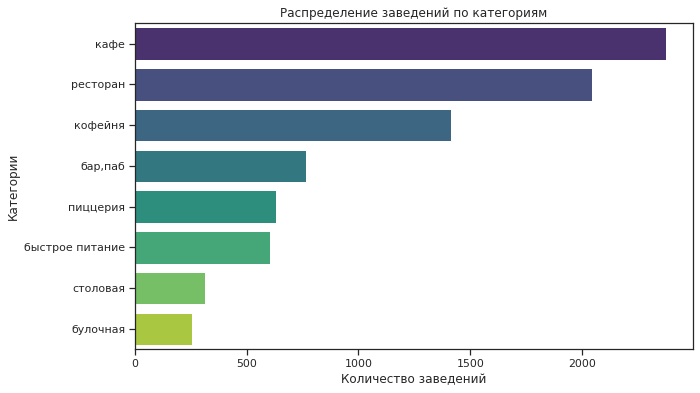

In [18]:
# Визуализация распределения заведений по категориям
plt.figure(figsize=(10, 6))
sns.barplot(x=category_counts.values, y=category_counts.index, palette="viridis")
plt.xlabel("Количество заведений")
plt.ylabel("Категории")
plt.title("Распределение заведений по категориям")
plt.show()

Больше всего заведений в категории кафе, далее идут ресторан и кофейня

### Исследование количества посадочных мест по категориям

In [19]:
# Исследование количества посадочных мест по категориям
seats_by_category = df.groupby('category')['seats'].median().sort_values().reset_index()
seats_by_category['seats'] = round(seats_by_category['seats'], 2)
seats_by_category['percent'] =round(seats_by_category['seats']/seats_by_category['seats'].sum()*100,2)
seats_by_category

,category,seats,percent
0,булочная,50.0,9.03
1,пиццерия,55.0,9.94
2,кафе,60.0,10.84
3,быстрое питание,65.0,11.74
4,столовая,75.5,13.64
5,кофейня,80.0,14.45
6,"бар,паб",82.0,14.81
7,ресторан,86.0,15.54


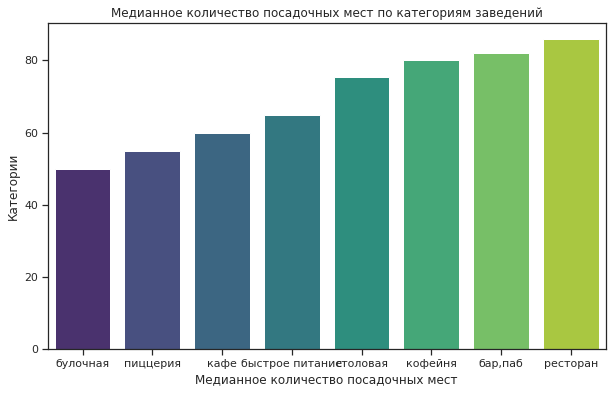

In [20]:
# Визуализация количества посадочных мест по категориям
plt.figure(figsize=(10, 6))
sns.barplot(x=seats_by_category['category'], y=seats_by_category['seats'], palette="viridis")
plt.xlabel("Медианное количество посадочных мест")
plt.ylabel("Категории")
plt.title("Медианное количество посадочных мест по категориям заведений")
plt.show()

Больше всего посадочных мест в ресторанах, бар,пабах, далее кофейни и столовые

### Сетевые заведения

In [21]:
chain = df[df['chain'] > 0]
chain = chain.groupby('name').size().reset_index(name='count').sort_values(by='count', ascending = False)
chain.head(200)

,name,count
731,ШОКОЛАДНИЦА,120
337,ДОМИНО'С ПИЦЦА,76
333,ДОДО ПИЦЦА,74
146,ONE PRICE COFFEE,71
744,ЯНДЕКС ЛАВКА,69
58,COFIX,65
168,PRIME,50
666,ХИНКАЛЬНАЯ,44
411,КОФЕПОРТ,42
420,КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ,39


In [22]:
words_to_remove = [
    'ХИНКАЛЬНАЯ',
    'ШАУРМА',
    'ЧАЙХАНА',
    'СТОЛОВАЯ',
    'КОФЕЙНЯ',
    'КАФЕ-СТОЛОВАЯ',
    'ХАЛЯЛЬ',
    'ЧАЙХОНА',
    'БУФЕТ',
    'ГРУЗИНСКАЯ КУХНЯ',
    'ПЕКАРНЯ',
    'ТРАПЕЗНАЯ',
    'ХАЧАПУРИ',
    'КОФЕ',
    'КОФЕ С СОБОЙ',
    'ШАШЛЫЧНАЯ',
    'КАФЕ',
    'ХАЧАПУРИ',
    'КАФЕ БАР',
    'ВЫПЕЧКА',
    'ЧАЙНАЯ'
]

# Функция для проверки, содержит ли строка слова из списка
def contains_prohibited_words(name):
    for word in words_to_remove:
        if word.lower() in name.lower():
            return True
    return False

# Фильтруем DataFrame, исключая строки, которые содержат слова из списка
chain = chain[~chain['name'].apply(contains_prohibited_words)].reset_index(drop=True)

chain.head(30)

,name,count
0,ШОКОЛАДНИЦА,120
1,ДОМИНО'С ПИЦЦА,76
2,ДОДО ПИЦЦА,74
3,ONE PRICE COFFEE,71
4,ЯНДЕКС ЛАВКА,69
5,COFIX,65
6,PRIME,50
7,КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ,39
8,ТЕРЕМОК,38
9,COFEFEST,32


In [23]:
# Проверяем, содержится ли значение df['name'] в chain['name']
df['chain_2'] = df['name'].isin(chain['name']).astype(int)

# Выводим результат
df.head(10)

,name,category,address,district,hours,...,chain,seats,street,is_24_7,chain_2
0,WOWФЛИ,кафе,"МОСКВА, УЛИЦА ДЫБЕНКО, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",...,0,NaN,УЛИЦА ДЫБЕНКО,False,0
1,ЧЕТЫРЕ КОМНАТЫ,ресторан,"МОСКВА, УЛИЦА ДЫБЕНКО, 36, КОРП. 1",Северный административный округ,"ежедневно, 10:00–22:00",...,0,4.0,УЛИЦА ДЫБЕНКО,False,0
2,ХАЗРИ,кафе,"МОСКВА, КЛЯЗЬМИНСКАЯ УЛИЦА, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",...,0,45.0,КЛЯЗЬМИНСКАЯ УЛИЦА,False,0
3,DORMOUSE COFFEE SHOP,кофейня,"МОСКВА, УЛИЦА МАРШАЛА ФЕДОРЕНКО, 12",Северный административный округ,"ежедневно, 09:00–22:00",...,0,NaN,УЛИЦА МАРШАЛА ФЕДОРЕНКО,False,0
4,ИЛЬ МАРКО,пиццерия,"МОСКВА, ПРАВОБЕРЕЖНАЯ УЛИЦА, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",...,1,148.0,ПРАВОБЕРЕЖНАЯ УЛИЦА,False,1
5,SERGIO PIZZA,пиццерия,"МОСКВА, ИЖОРСКАЯ УЛИЦА, ВЛ8Б",Северный административный округ,"ежедневно, 10:00–23:00",...,0,NaN,ИЖОРСКАЯ УЛИЦА,False,0
6,ОГНИ ГОРОДА,"бар,паб","МОСКВА, КЛЯЗЬМИНСКАЯ УЛИЦА, 9, СТР. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,...,0,45.0,КЛЯЗЬМИНСКАЯ УЛИЦА,False,0
7,MR. УГОЛЁК,быстрое питание,"МОСКВА, КЛЯЗЬМИНСКАЯ УЛИЦА, 9, СТР. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",...,0,45.0,КЛЯЗЬМИНСКАЯ УЛИЦА,False,0
8,DONNA MARIA,ресторан,"МОСКВА, ДМИТРОВСКОЕ ШОССЕ, 107, КОРП. 4",Северный административный округ,"ежедневно, 10:00–22:00",...,0,79.0,ДМИТРОВСКОЕ ШОССЕ,False,0
9,ГОТИКА,кафе,"МОСКВА, АНГАРСКАЯ УЛИЦА, 39",Северный административный округ,"ежедневно, 12:00–00:00",...,0,65.0,АНГАРСКАЯ УЛИЦА,False,0


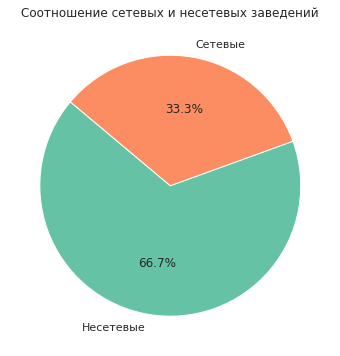

In [24]:
# Соотношение сетевых и несетевых заведений
chain_counts = df['chain_2'].value_counts(normalize=True)

# Визуализация соотношения сетевых и несетевых заведений
plt.figure(figsize=(6, 6))
plt.pie(chain_counts, labels=['Несетевые', 'Сетевые'], autopct='%1.1f%%', startangle=140, colors=['#66c2a5','#fc8d62'])
plt.title("Соотношение сетевых и несетевых заведений")
plt.show()

Мы видим что сетевых заведений меньше, около 33 %

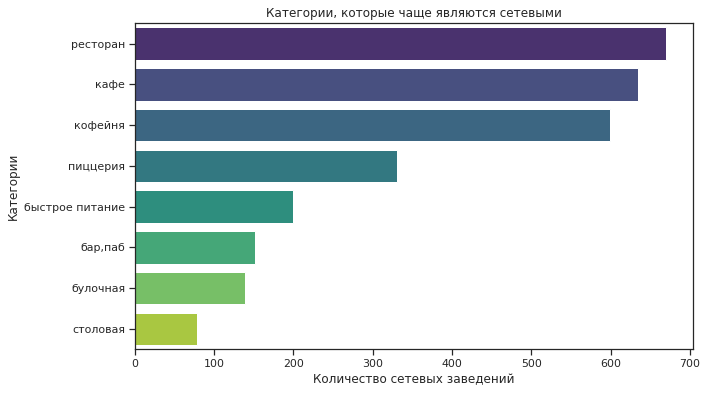

In [25]:
# Категории заведений, которые чаще являются сетевыми
chain_category_counts = df[df['chain_2'] == 1]['category'].value_counts()

# Визуализация категорий сетевых заведений
plt.figure(figsize=(10, 6))
sns.barplot(x=chain_category_counts.values, y=chain_category_counts.index, palette="viridis")
plt.xlabel("Количество сетевых заведений")
plt.ylabel("Категории")
plt.title("Категории, которые чаще являются сетевыми")
plt.show()

Рестораны, кафе и кофейни чаще являются сетевыми. 

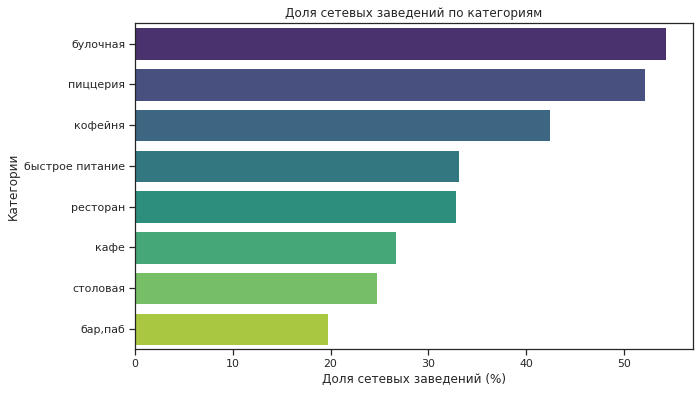

Доля сетевых заведений в каждой категории (в процентах):
булочная           54.296875
пиццерия           52.132701
кофейня            42.392074
быстрое питание    33.167496
ресторан           32.810970
кафе               26.725589
столовая           24.761905
бар,паб            19.764398
Name: category, dtype: float64


In [26]:
# Общая сумма заведений по категориям
category_total_counts = df['category'].value_counts()

# Расчет доли сетевых заведений в каждой категории
chain_category_ratio = (chain_category_counts / category_total_counts * 100).sort_values(ascending=False)

# Визуализация долей сетевых заведений
plt.figure(figsize=(10, 6))
sns.barplot(x=chain_category_ratio.values, y=chain_category_ratio.index, palette="viridis")
plt.xlabel("Доля сетевых заведений (%)")
plt.ylabel("Категории")
plt.title("Доля сетевых заведений по категориям")
plt.show()

# Вывод данных для дополнительного анализа
print("Доля сетевых заведений в каждой категории (в процентах):")
print(chain_category_ratio)

В такикх категориях, как булучная и пицерия доля сетевых заведений больше 50%, меньше всего барах/пабах и столовых

In [27]:
# Топ-15 популярных сетей
top_15_chains = df[df['chain_2'] == 1].groupby('name').size().sort_values(ascending=False).head(15)
top_15_chains

name
ШОКОЛАДНИЦА                            120
ДОМИНО'С ПИЦЦА                          77
ДОДО ПИЦЦА                              74
ONE PRICE COFFEE                        72
ЯНДЕКС ЛАВКА                            69
COFIX                                   65
PRIME                                   50
КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ     39
ТЕРЕМОК                                 38
БУХАНКА                                 32
COFEFEST                                32
МУ-МУ                                   27
DRIVE CAFÉ                              24
КРОШКА КАРТОШКА                         22
АНДЕРСОН                                22
dtype: int64

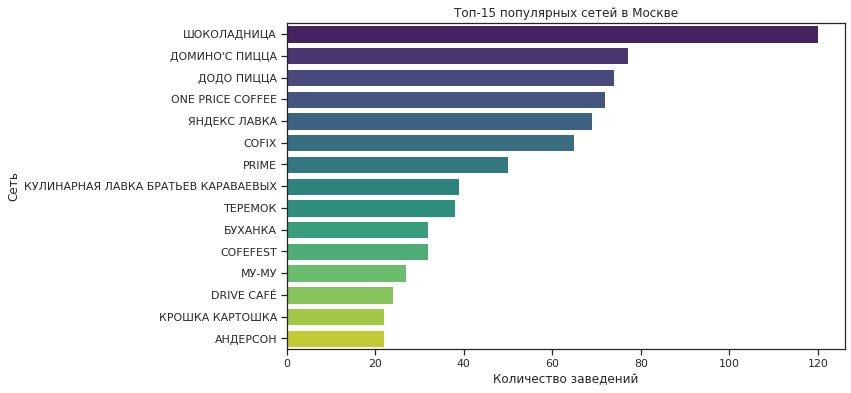

In [28]:
# Визуализация топ-15 популярных сетей
plt.figure(figsize=(10, 6))
sns.barplot(x=top_15_chains.values, y=top_15_chains.index, palette="viridis")
plt.xlabel("Количество заведений")
plt.ylabel("Сеть")
plt.title("Топ-15 популярных сетей в Москве")
plt.show()

Шоколданица самая поплярная сеть, заметно выделяется, далее идут Домино Пицца, Додо, ONE PRICE COFFE. Превалируют заведение с категорией кафе, кофейня

In [29]:
# Добавление категорий к топ-15 сетям
top_15_chains_with_categories = (
    df[df['name'].isin(top_15_chains.index)]
    .groupby('name')['category']
    .first()
    .reindex(top_15_chains.index)  # Сохраняем порядок топ-15
)

# Создаем DataFrame для удобства
top_15_chains_df = pd.DataFrame({
    'Количество заведений': top_15_chains,
    'Категория': top_15_chains_with_categories
})


# Подсчет общего количества заведений в каждой категории
category_total_counts = df.groupby('category').size()

# Подсчет количества сетевых заведений в каждой категории для топ-15 сетей
top_15_category_chain_counts = (
    df[df['name'].isin(top_15_chains.index)]
    .groupby('category')
    .size()
)

# Расчет доли сетевых заведений в их категориях
top_15_category_chain_ratio = (
    top_15_category_chain_counts / category_total_counts * 100
)

# Объединение данных о доле в категории с таблицей топ-15
top_15_chains_categories = (
    df[df['name'].isin(top_15_chains.index)]
    .groupby('name')['category']
    .first()
    .reindex(top_15_chains.index)
)

# Добавляем доли в категорию в таблицу топ-15
top_15_chains_df['Категория'] = top_15_chains_categories
top_15_chains_df['Доля в категории (%)'] = top_15_chains_df.apply(
    lambda row: top_15_category_chain_ratio.get(row['Категория'], 0), axis=1
)

top_15_chains_df = top_15_chains_df

print("Топ-15 популярных сетей с указанием категории и доли в категории:")
display(top_15_chains_df)

Топ-15 популярных сетей с указанием категории и доли в категории:


,Количество заведений,Категория,Доля в категории (%)
name,,,
ШОКОЛАДНИЦА,120,кофейня,20.948337
ДОМИНО'С ПИЦЦА,77,пиццерия,24.012638
ДОДО ПИЦЦА,74,пиццерия,24.012638
ONE PRICE COFFEE,72,кофейня,20.948337
ЯНДЕКС ЛАВКА,69,ресторан,8.178257
COFIX,65,кофейня,20.948337
PRIME,50,ресторан,8.178257
КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ,39,кафе,4.082492
ТЕРЕМОК,38,ресторан,8.178257


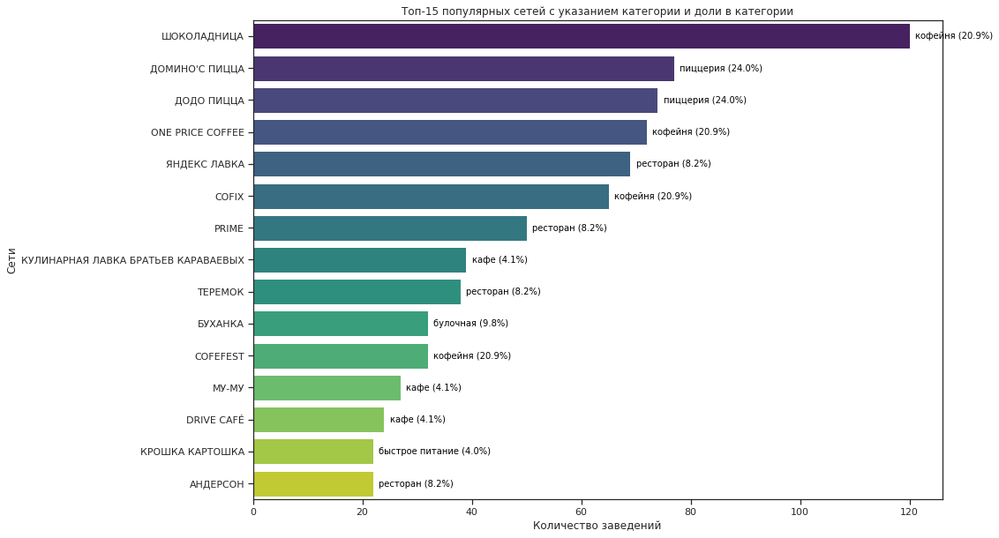

In [30]:
# Визуализация с добавлением долей в категории
plt.figure(figsize=(14, 10))
sns.barplot(
    x=top_15_chains.values,
    y=top_15_chains.index,
    palette="viridis"
)

# Добавляем подписи с категориями и долями на график
for i, (count, category, ratio) in enumerate(zip(top_15_chains.values, top_15_chains_categories, top_15_chains_df['Доля в категории (%)'])):
    plt.text(
        count + 1, i, f"{category} ({ratio:.1f}%)",
        va='center', ha='left', fontsize=10, color='black'
    )

plt.xlabel("Количество заведений")
plt.ylabel("Сети")
plt.title("Топ-15 популярных сетей с указанием категории и доли в категории")
plt.show()


Шоколданица самая популярная сеть, заметно выделяется среди других и в своей категории (кофейня) занимает 20%, далее идут Домино Пицца ( 24% ), Додо ( 24% ), ONE PRICE COFFE ( 20% ). В топах заведения с категориями кофейня и пиццерия. 

In [31]:
# Загрузка geojson файла
with open('/datasets/admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
    districts_geo = json.load(f)

In [32]:
# Какие административные районы присутствуют в датасете?
district_counts = df['district'].value_counts().reset_index()
district_counts['persent'] = round(district_counts['district']/district_counts['district'].sum()*100, 2) 
district_counts

,index,district,persent
0,Центральный административный округ,2242,26.68
1,Северный административный округ,898,10.69
2,Южный административный округ,892,10.62
3,Северо-Восточный административный округ,890,10.59
4,Западный административный округ,850,10.12
5,Восточный административный округ,798,9.50
6,Юго-Восточный административный округ,714,8.50
7,Юго-Западный административный округ,709,8.44
8,Северо-Западный административный округ,409,4.87


In [33]:
# Отобразите общее количество заведений и количество заведений каждой категории по районам
category_district_counts = df.groupby(['district', 'category']).size().unstack(fill_value=0)
category_district_counts

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40
Западный административный округ,50,37,62,238,150,71,218,24
Северный административный округ,68,39,58,234,193,77,188,41
Северо-Восточный административный округ,62,28,82,269,159,68,182,40
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Центральный административный округ,364,50,87,464,428,113,670,66
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Южный административный округ,68,25,85,264,131,73,202,44


<Figure size 1080x576 with 0 Axes>

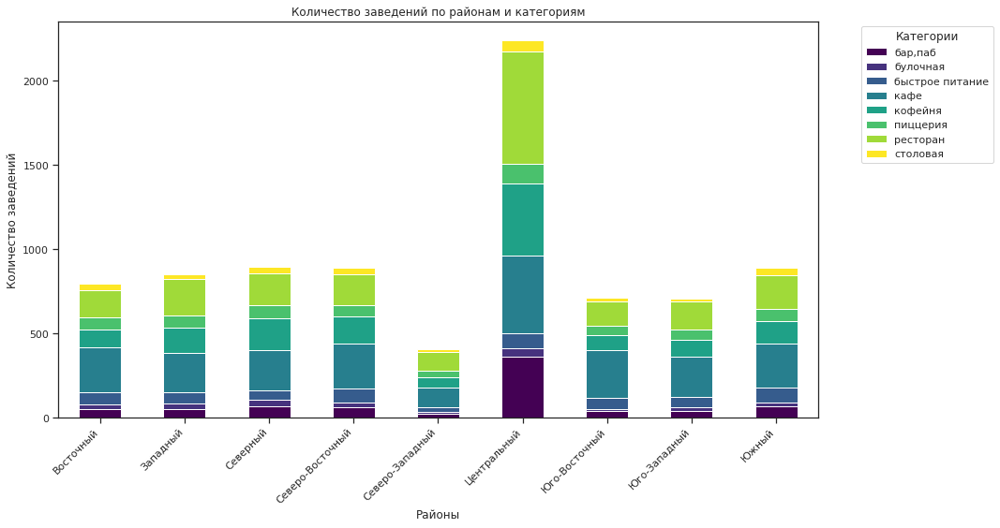

In [34]:
def shorten_district_names(name):
    # Сокращение длинных названий до первых слов или до заданного количества символов
    return ' '.join(name.split()[:1])  # Возьмем первые два слова

# Применим эту функцию к индексам DataFrame
category_district_counts = category_district_counts.rename(index=shorten_district_names)

# Перерисовка графика с сокращенными названиями
plt.figure(figsize=(15, 8))
category_district_counts.plot(kind='bar', stacked=True, figsize=(15, 8), colormap='viridis')
plt.xlabel("Районы")
plt.ylabel("Количество заведений")
plt.xticks(rotation=45, ha='right')  # Поворот подписей
plt.title("Количество заведений по районам и категориям")
plt.legend(title="Категории", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

Больще всего заведений в центральном округе, особенно ресторанов, пиццерий, кофейнь.

In [35]:
# Визуализируем распределение средних рейтингов по категориям заведений
average_ratings_by_category = df.groupby('category')['rating'].mean()
average_ratings_by_category

category
бар,паб            4.387696
булочная           4.268359
быстрое питание    4.050249
кафе               4.124285
кофейня            4.277282
пиццерия           4.301264
ресторан           4.290402
столовая           4.211429
Name: rating, dtype: float64

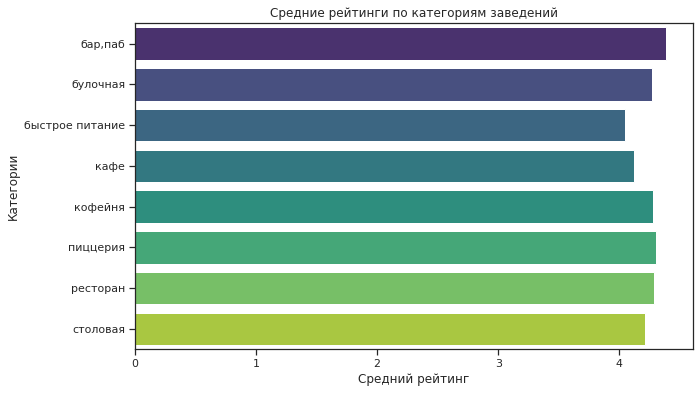

In [36]:
# Визуализируем распределения средних рейтингов
plt.figure(figsize=(10, 6))
sns.barplot(x=average_ratings_by_category.values, y=average_ratings_by_category.index, palette="viridis")
plt.xlabel("Средний рейтинг")
plt.ylabel("Категории")
plt.title("Средние рейтинги по категориям заведений")
plt.show()

Средний рейтинг по районам примерно одинаковый и больше 4 звезд

In [37]:
# Построим фоновую картограмму с рейтингом заведений каждого района
rating_df = df.groupby('district', as_index=False)['rating'].agg('median')
rating_df

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [38]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создание карты
district_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')


# Добавляем данные в карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(district_map)


# Вывод карты
district_map

In [39]:
# Отобразите все заведения датасета на карте с помощью кластеров
moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(moscow_map)

for idx, row in df.iterrows():
    if not pd.isnull(row['lat']) and not pd.isnull(row['lng']):
        folium.Marker(location=[row['lat'], row['lng']], popup=row['name']).add_to(marker_cluster)

moscow_map

### Исследуем заведения, взависимости от улицы на которой они находятся

In [40]:
# Найдем топ-15 улиц по количеству заведений
top_15_streets = df['street'].value_counts().head(15)
top_15_streets

ПРОСПЕКТ МИРА             183
ПРОФСОЮЗНАЯ УЛИЦА         122
ПРОСПЕКТ ВЕРНАДСКОГО      108
ЛЕНИНСКИЙ ПРОСПЕКТ        107
ЛЕНИНГРАДСКИЙ ПРОСПЕКТ     95
ДМИТРОВСКОЕ ШОССЕ          88
КАШИРСКОЕ ШОССЕ            77
ВАРШАВСКОЕ ШОССЕ           76
ЛЕНИНГРАДСКОЕ ШОССЕ        70
МКАД                       65
ЛЮБЛИНСКАЯ УЛИЦА           60
УЛИЦА ВАВИЛОВА             55
КУТУЗОВСКИЙ ПРОСПЕКТ       54
УЛИЦА МИКЛУХО-МАКЛАЯ       49
ПЯТНИЦКАЯ УЛИЦА            48
Name: street, dtype: int64

In [41]:
street_category_counts = (
    df[df['street'].isin(top_15_streets.index)]
    .groupby(['street', 'category'])
    .size()
    .unstack(fill_value=0)
    .sort_values(by='ресторан')
)

street_category_counts

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
МКАД,1,0,9,45,4,0,5,1
ЛЮБЛИНСКАЯ УЛИЦА,5,0,5,26,11,1,10,2
УЛИЦА ВАВИЛОВА,2,2,11,15,10,3,12,0
УЛИЦА МИКЛУХО-МАКЛАЯ,3,0,4,21,4,2,15,0
КУТУЗОВСКИЙ ПРОСПЕКТ,2,1,2,14,13,3,16,3
ПЯТНИЦКАЯ УЛИЦА,9,3,2,7,6,3,18,0
КАШИРСКОЕ ШОССЕ,2,0,10,20,16,5,19,5
ВАРШАВСКОЕ ШОССЕ,6,0,7,18,14,4,20,7
ДМИТРОВСКОЕ ШОССЕ,6,2,10,23,11,8,24,4


<Figure size 1296x1080 with 0 Axes>

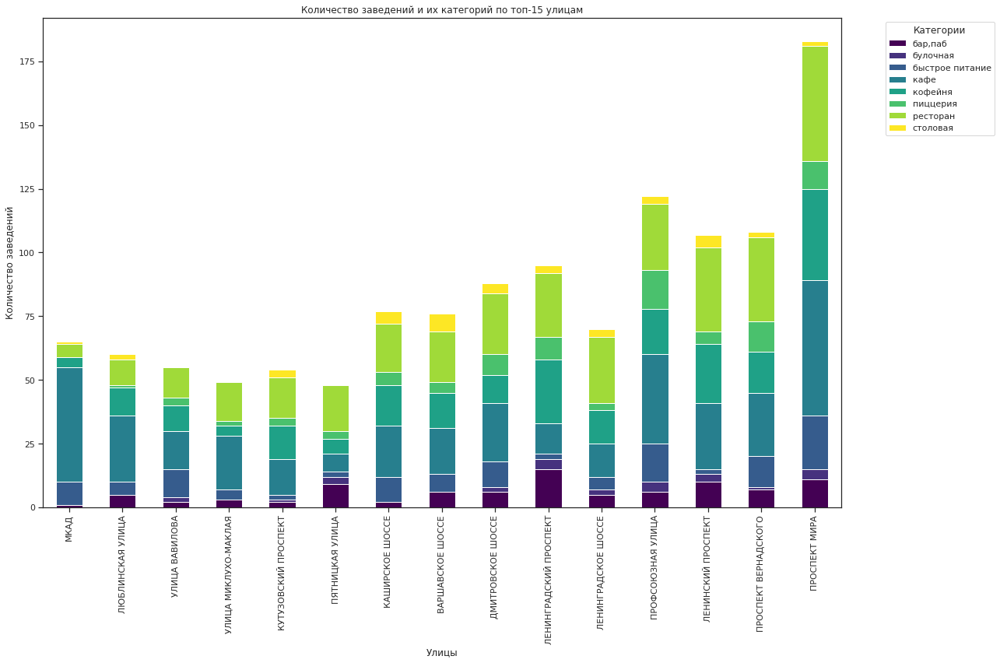

In [42]:
# Визуализация количества заведений и категорий по улицам
plt.figure(figsize=(18, 15))
street_category_counts.plot(kind='bar', stacked=True, figsize=(18, 12), colormap='viridis')
plt.xlabel("Улицы")
plt.ylabel("Количество заведений")
plt.title("Количество заведений и их категорий по топ-15 улицам")
plt.legend(title="Категории", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

Мы видим, что на улице Проспекте Мира больше всего заведений, а вот на улице Пятницкая меньше всего. Так же что не на всех улицах есть столовые.

In [43]:
# Найдем улицы, на которых находится только один объект общепита
streets_with_one_place = df['street'].value_counts()
single_place_streets = streets_with_one_place[streets_with_one_place == 1].index
# Заведения на этих улицах
single_place_data = df[df['street'].isin(single_place_streets)]
print(single_place_data[['name', 'street', 'category', 'rating', 'price']].head(10))

                   name                               street         category  \
15            ДОМ ОБЕДА              УЛИЦА БУСИНОВСКАЯ ГОРКА         столовая   
21                 7/12                    ПРИБРЕЖНЫЙ ПРОЕЗД             кафе   
25      В ПАРКЕ ВКУСНЕЕ                    ПАРК ЛЕВОБЕРЕЖНЫЙ          кофейня   
58        COFFEEKALDI'S                      УГЛИЧСКАЯ УЛИЦА          кофейня   
60   ЧЕБУРЕЧНАЯ ИСТОРИЯ    ЛАНДШАФТНЫЙ ЗАКАЗНИК ЛИАНОЗОВСКИЙ          кофейня   
64          TESTO МАНИЯ  ЛИАНОЗОВСКИЙ ПАРК КУЛЬТУРЫ И ОТДЫХА          кофейня   
71             COFEFEST                   НОВГОРОДСКАЯ УЛИЦА          кофейня   
73              ВЕРАНДА                       ПАРК АЛТУФЬЕВО         ресторан   
97          ЖИГУЛЕВСКОЕ                    БИБИРЕВСКАЯ УЛИЦА          бар,паб   
103               ТЕТРИ                  ЛИАНОЗОВСКИЙ ПРОЕЗД  быстрое питание   

     rating    price  
15      4.1  средние  
21      4.5      NaN  
25      4.3      NaN  
58      4.1  сре

In [44]:
# Иследуем улицы на которых находится только один объект общепита
streets_one = single_place_data.describe()
streets_one

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats,chain_2
count,457.000000,457.000000,457.000000,165.000000,24.000000,457.000000,156.000000,457.000000
mean,55.759868,37.617335,4.238950,959.830303,186.166667,0.291028,59.115385,0.247265
std,0.063725,0.093538,0.459898,999.518083,55.544472,0.454734,48.274880,0.431895
min,55.578830,37.387459,1.000000,67.000000,95.000000,0.000000,0.000000,0.000000
25%,55.729080,37.561508,4.100000,325.000000,140.000000,0.000000,30.000000,0.000000
50%,55.760398,37.613212,4.300000,625.000000,177.500000,0.000000,45.000000,0.000000
75%,55.795595,37.667388,4.500000,1250.000000,213.750000,1.000000,80.000000,0.000000
max,55.914074,37.867004,5.000000,7000.000000,320.000000,1.000000,240.000000,1.000000


In [45]:
count_single_place_data = single_place_data.groupby('category')['name'].count()
count_single_place_data

category
бар,паб             39
булочная             8
быстрое питание     23
кафе               159
кофейня             84
пиццерия            15
ресторан            93
столовая            36
Name: name, dtype: int64

Всего 457 улицы, на которых находится только 1 зведение. Больше всего среди таких заведений кафе,не сетевых, средний рейтинг около 4 звезд.

In [46]:
# Построbv фоновую картограмму (хороплет) с ценами

median_by_district = df.groupby('district')['middle_avg_bill'].median().reset_index()
median_by_district

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [47]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создание карты
district_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')


# Добавление данных на карту
district_price_dict = median_by_district.set_index('district')['middle_avg_bill'].to_dict()
folium.Choropleth(
    geo_data=districts_geo,
    data=district_price_dict,
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Медианный чек по районам (руб.)'
).add_to(district_map)

district_map


Мы видим что медианный чек в Западном и Центральном административном округе выше остальных

Вывод:

- Категории заведений:\
Большее количество заведений представлено в категории кафе, за которыми следуют рестораны и кофейни. Это свидетельствует о предпочтениях потребителей к более неформальной и доступной еде и напиткам.
Заведений с большим количеством посадочных мест больше всего в барах и пабах, что указывает на их популярность как мест для отдыха и общения.
- Сетевые заведения:\
Наиболее популярной сетью среди заведений является Шоколданица, которая значительно выделяется на фоне конкурентов. Далее идут такие сети, как Домино Пицца, Додо и ONE PRICE COFFE.
Общее количество сетевых заведений составляет около 33%, с преобладанием кафе и кофеен среди них. Это может обозначать устойчивый тренд к расширению сетевых форматов в данной категории.
- Рейтинги:\
Рейтинги среди различных типов общепита не показывают значительных различий, что может говорить о сравнительно равном качестве обслуживания и предлагаемых услуг в этих заведениях.
- Географическое распределение:\
Наибольшее количество заведений расположено в центральном округе, где особой популярностью пользуются рестораны, пиццерии и кофейни. Это может быть связано с высокой проходимостью и наличием целевой аудитории.
Важным аспектом является то, что на Простекте Мира сосредоточено больше всего заведений, в то время как на улице Пятницкая число заведений минимально. 
- Одиночные заведения:\
Среди улиц, на которых находится только одно заведение, наибольшее количество занимают кафе не сетевого формата, что говорит о возможности местного бизнеса эффективно работать в условиях ограниченной конкуренции. Средний рейтинг таких заведений составляет около 4 звезд, что подчеркивает качество и востребованность предлагаемых услуг.
- Ценовые категории:\
Медианный чек в Западном и Центральном админ округе выше, чем в других округах
    

## Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. 
Попробуем определить, осуществима ли мечта клиентов.

In [48]:
# Сколько всего кофеен в датасете?
cafes = df[df['category'].str.contains('кофейня', case=False, na=False)]
total_cafes = cafes.shape[0]
print(f"Всего кофеен в датасете: {total_cafes}")

Всего кофеен в датасете: 1413


In [49]:
# В каких районах их больше всего?
cafes_by_district = cafes['district'].value_counts()
print("\nКоличество кофеен по районам:")
print(cafes_by_district)


Количество кофеен по районам:
Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: district, dtype: int64


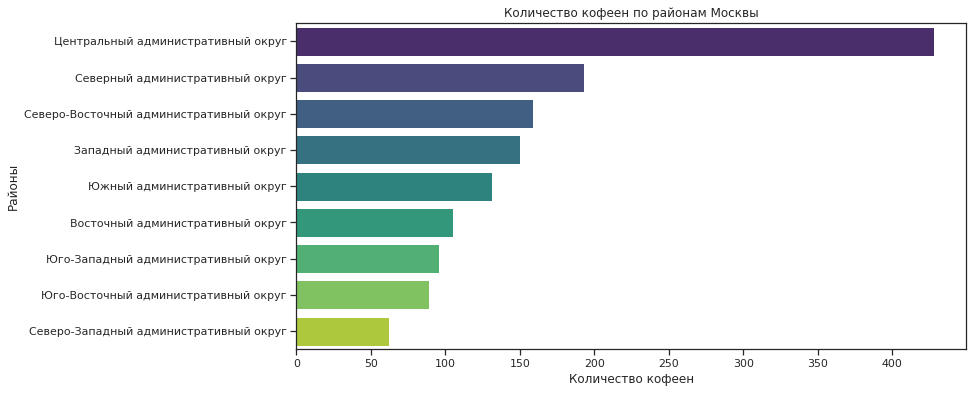

In [50]:
# Визуализация кофеен по районам
plt.figure(figsize=(12, 6))
sns.barplot(x=cafes_by_district.values, y=cafes_by_district.index, palette="viridis")
plt.title("Количество кофеен по районам Москвы")
plt.xlabel("Количество кофеен")
plt.ylabel("Районы")
plt.show()


В Центральном округе больше всего кофейн.

In [51]:
cafes

,name,category,address,district,hours,...,chain,seats,street,is_24_7,chain_2
3,DORMOUSE COFFEE SHOP,кофейня,"МОСКВА, УЛИЦА МАРШАЛА ФЕДОРЕНКО, 12",Северный административный округ,"ежедневно, 09:00–22:00",...,0,NaN,УЛИЦА МАРШАЛА ФЕДОРЕНКО,False,0
25,В ПАРКЕ ВКУСНЕЕ,кофейня,"МОСКВА, ПАРК ЛЕВОБЕРЕЖНЫЙ",Северный административный округ,"ежедневно, 10:00–21:00",...,1,NaN,ПАРК ЛЕВОБЕРЕЖНЫЙ,False,1
45,9 BAR COFFEE,кофейня,"МОСКВА, КОРОВИНСКОЕ ШОССЕ, 41, СТР. 1",Северный административный округ,пн-пт 08:00–18:00,...,1,46.0,КОРОВИНСКОЕ ШОССЕ,False,1
46,COFEFEST,кофейня,"МОСКВА, УЛИЦА МАРШАЛА ФЕДОРЕНКО, 6С1",Северный административный округ,пн-пт 09:00–19:00,...,1,NaN,УЛИЦА МАРШАЛА ФЕДОРЕНКО,False,1
52,COFIX,кофейня,"МОСКВА, УЛИЦА ДЫБЕНКО, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",...,1,NaN,УЛИЦА ДЫБЕНКО,False,1
...,...,...,...,...,...,...,...,...,...,...,...
8356,НАЗИС ПУРИ,кофейня,"МОСКВА, ЛЮБЛИНСКАЯ УЛИЦА, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",...,0,NaN,ЛЮБЛИНСКАЯ УЛИЦА,False,0
8365,КВАДРАТ КОФЕ,кофейня,"МОСКВА, ВОЛГОГРАДСКИЙ ПРОСПЕКТ, 73, СТР. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",...,0,206.0,ВОЛГОГРАДСКИЙ ПРОСПЕКТ,False,0
8376,ШОКОЛАД ИМБИРЬ КОРИЦА,кофейня,"МОСКВА, ГРАЙВОРОНОВСКАЯ УЛИЦА, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,...,0,NaN,ГРАЙВОРОНОВСКАЯ УЛИЦА,False,0
8385,CAFIO,кофейня,"МОСКВА, НОВОХОХЛОВСКАЯ УЛИЦА, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",...,0,NaN,НОВОХОХЛОВСКАЯ УЛИЦА,False,0


In [52]:
# Есть ли круглосуточные кофейни?
num_24_7_cafes = num_24_7_cafes = cafes['is_24_7'].sum()
print(f"\nКоличество круглосуточных кофеен: {num_24_7_cafes}")


Количество круглосуточных кофеен: 59


In [53]:
# Какие у кофеен рейтинги? Как они распределяются по районам?
average_rating_by_district = round(cafes.groupby('district')['rating'].mean().sort_values(ascending=False), 2)
average_rating_by_district

district
Центральный административный округ         4.34
Северо-Западный административный округ     4.33
Северный административный округ            4.29
Юго-Западный административный округ        4.28
Восточный административный округ           4.28
Южный административный округ               4.23
Юго-Восточный административный округ       4.23
Северо-Восточный административный округ    4.22
Западный административный округ            4.20
Name: rating, dtype: float64

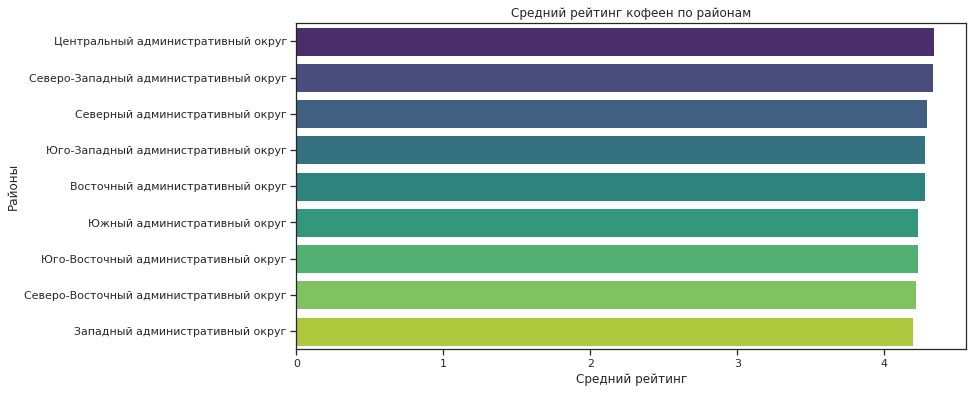

In [54]:
# Визуализация рейтингов кофеен по районам
plt.figure(figsize=(12, 6))
sns.barplot(x=average_rating_by_district.values, y=average_rating_by_district.index, palette="viridis")
plt.title("Средний рейтинг кофеен по районам")
plt.xlabel("Средний рейтинг")
plt.ylabel("Районы")
plt.show()

Рейтинги примерно одинаковые и все выше 4.2

In [55]:
# На какую стоимость чашки капучино стоит ориентироваться?
average_cappuccino_price = cafes['middle_coffee_cup'].median()
print(f"\nРекомендуемая стоимость чашки капучино: {average_cappuccino_price:.2f} руб.")


Рекомендуемая стоимость чашки капучино: 170.00 руб.


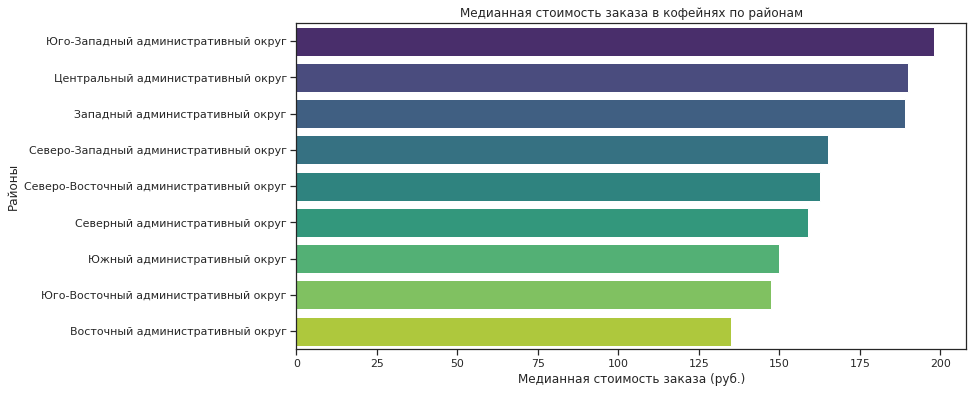

In [56]:
# Визуализация цен по районам
median_price_by_district = cafes.groupby('district')['middle_coffee_cup'].median().sort_values(ascending=False)
plt.figure(figsize=(12, 6))
sns.barplot(x=median_price_by_district.values, y=median_price_by_district.index, palette="viridis")
plt.title("Медианная стоимость заказа в кофейнях по районам")
plt.xlabel("Медианная стоимость заказа (руб.)")
plt.ylabel("Районы")
plt.show()

Медианная стоимость заказов выше в Юго-Западном, Центральном и Западном округе

In [57]:
median_price_by_district

district
Юго-Западный административный округ        198.0
Центральный административный округ         190.0
Западный административный округ            189.0
Северо-Западный административный округ     165.0
Северо-Восточный административный округ    162.5
Северный административный округ            159.0
Южный административный округ               150.0
Юго-Восточный административный округ       147.5
Восточный административный округ           135.0
Name: middle_coffee_cup, dtype: float64

В Юго-Заподном округе стоимость дороже,а в Восточном самая дешевая медианная стоимость одной чашки кофе.

Вывод:
    
Графики в анализе показывают, что кафе и кофейни сейчас популярны. Для более полного анализа, нужно дополнительно исследовать трафик.

Если ориентироваться на на текущие данный, возможно кофейню лучше открыть в Юго-западном или Западном районе, там меньше конкуренция и выше чек.

Или предполагая, что в Центральном районе больше туристов и тех, кто просто гуляет-отдыхает, открыть тематическую кофейню в центре. Стоимость сделать около 190 рублей (конечно здесь нужны данные по расходам)




   [Ссылка на гугл-презентацию](https://docs.google.com/presentation/d/1t4fzO2ghL4kxtQuVHQPj52zipRS3Wva0/edit?usp=drive_link&ouid=115851613994063809702&rtpof=true&sd=true)

   [Ссылка на презентацию в .pdf](https://drive.google.com/file/d/1AfkkbEEfSFw_eLnyMOq2gbQ2bpfWswvo/view?usp=sharing)